In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as colors
import matplotlib.ticker
import scipy.optimize as op
import matplotlib.cm as cm
from scipy import special as sp
from scipy import integrate
%config InlineBackend.figure_format = 'svg'

# Simulation of electron hole from two stream instabilities

In [2]:
T = 1.0
# k = 0.1
# L = 2*np.pi/k
L = 100
k = 2*np.pi/L
u = 1.2

vmax = 10 # 速度最大值
nx = 2000
nv = 1000
dx = L/(nx-1)
dv = 2*vmax/(nv-1)
x = np.linspace(0, L, num=nx, endpoint=True)
v = np.linspace(-vmax, vmax, num=nv, endpoint=True)
V,X=np.meshgrid(v,x)
dt = 0.05
max_steps  = 100
data_steps = max_steps
data_num = int(max_steps/data_steps)+1

path = '../../data/'
print(data_num)
print('k=',k)
print('limited time=',2*np.pi/k/dv)
print('real time = ', max_steps*dt)

2
k= 0.06283185307179587
limited time= 4994.999999999999
real time =  5.0


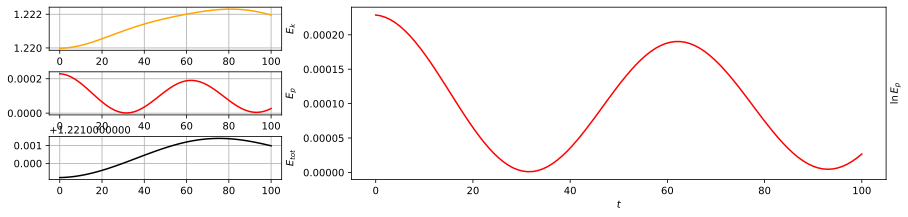

In [3]:
dataet = np.loadtxt(os.path.join(path,"tot_energy"))[0:max_steps]
dataep = np.loadtxt(os.path.join(path,"pot_energy"))[0:max_steps]
dataek = np.loadtxt(os.path.join(path,"kin_energy"))[0:max_steps]

t = np.linspace(0, max_steps, max_steps)
fig = plt.figure(figsize=(15, 3))

ax1 = plt.subplot2grid((3, 3), (0, 0))
ax1.plot(t, dataek, color='orange')
ax1.grid()
ax1.set_ylabel(r'$E_k$')
ax1.yaxis.set_label_position("right")

ax2 = plt.subplot2grid((3, 3), (1, 0))
ax2.plot(t, dataep, color='r')
ax2.grid()
ax2.set_ylabel(r'$E_p$')
ax2.yaxis.set_label_position("right")

ax3 = plt.subplot2grid((3, 3), (2, 0))
ax3.plot(t, dataet, color='black')
ax3.grid()
ax3.set_ylabel(r'$E_{tot}$')
ax3.yaxis.set_label_position("right")

axl2 = plt.subplot2grid((3, 3), (0, 1),colspan=2, rowspan=3)
axl2.plot(t, dataep, color='r')
axl2.set_ylabel(r'$\ln E_p$')
# axl2.set_yscale('log')
axl2.yaxis.set_label_position("right")

fig.subplots_adjust(bottom=0.1, top=0.9, hspace=.5, wspace=.3)
plt.xlabel(r'$t$')
plt.show()

In [19]:
progesses = np.arange(0,data_num,1)

f = []
phi = []

for progess in progesses:
    f_temp = np.loadtxt(os.path.join(path,"fe"+str(progess)))
    f.append(f_temp)
    phi_temp = np.loadtxt(os.path.join(path,"phi"+str(progess)))
    phi.append(phi_temp)

In [20]:
fx0 = np.sum(f[0],axis=1)*dv
fv0 = np.sum(f[0],axis=0)*dx/L

In [21]:
fig = plt.figure(figsize=(8, 6))

test_frame = 1
fx = np.sum(f[test_frame],axis=1)*dv
fv = np.sum(f[test_frame],axis=0)*dx/L
# Z[np.where(Z<1e-8)]=0
lvs_idx = np.linspace(-10,1,num=50)
lvs = 10**lvs_idx

ax1 = plt.subplot2grid((2, 2), (0, 0))
# ax1cm = ax1.contourf(X, V, f[test_frame], levels=lvs,norm=colors.LogNorm(vmin=lvs.min(),vmax=lvs.max()),cmap=cm.plasma)
ax1cm = ax1.contourf(X, V, f[test_frame], levels=20,cmap=cm.plasma)
ax1.set_xlabel(r'$x$')
ax1.set_ylabel(r'$v$')
ax1.set_ylim(-1.5,1.5)

ax2 = plt.subplot2grid((2, 2), (0, 1))
ax2.plot(v, fv, color='red')
ax2.plot(v, fv0,'--', color='blue')
ax2.set_xlabel(r'$v$')
ax2.set_ylabel(r'$f_{v}$')
# ax2.set_yscale('log')
ax2.grid()

ax3 = plt.subplot2grid((2, 2), (1, 0))
# ax3.plot(x, fx, color='red')
ax3.plot(x, fx0,'--', color='blue')
ax2.set_xlabel(r'$v$')
ax3.set_xlabel(r'$x$')
ax3.set_ylabel(r'$fx$')
ax3.grid()

ax4 = plt.subplot2grid((2, 2), (1, 1))
# ax4.plot(x, phi[test_frame], color='red')
ax4.plot(x, phi[0],'--', color='blue')
# ax4.axhline(0.515,linestyle=':',color='black')
ax4.set_xlabel(r'$x$')
ax4.set_ylabel(r'$\phi$')
ax4.grid()

plt.suptitle("k="+str(k)+"; u="+str(u)+"; T=0.1")
plt.tight_layout()

In [22]:
ux = np.sqrt(u**2-2*phi[1][250]+2*phi[1])

In [23]:
testx=250
fig = plt.figure(figsize=(12, 5))
ax1 = plt.subplot(121)
plt.contourf(X, V, f[0], levels=15, cmap=cm.plasma)
plt.plot(x,ux)
plt.ylim(-1.5,1.5)

ax2 = plt.subplot(122)
plt.contourf(X, V, f[test_frame], levels=15, cmap=cm.plasma)
plt.plot(x,ux)
plt.axvline(testx/nx*L,linestyle=':')
# plt.xlim(0.25*L,0.75*L)
plt.ylim(-1.5,1.5)
plt.show()

In [24]:
def nonvec_f(v,phi):
    r = 0
    w = v**2-2*phi
    if w>0:
        r = ( np.exp(-(np.sqrt(w)+u)**2/2/T) 
             + np.exp(-(np.sqrt(w)-u)**2/2/T) )/2.0
    else:
        r = np.exp(-(u**2+w)/2/T)*(np.cos(np.sqrt(-w)*u/T))
    return r/np.sqrt(2*np.pi*T)
ff = np.vectorize(nonvec_f)

In [25]:
umax = np.pi/np.sqrt(8*phi[1][250])*T
print('umax=',umax)

umax= 6.339713696900268


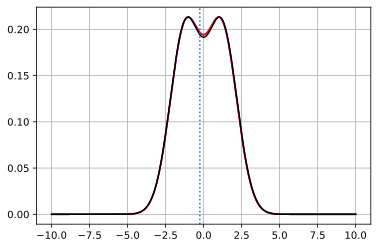

In [26]:
plt.plot(v,f[0][testx],color='blue')
plt.plot(v,f[1][testx],color='red')
# plt.plot(v,ff(v,0),color='black')
plt.plot(v,ff(v,phi[1][testx]),color='black')
plt.axvline(-np.sqrt(2*phi[1][testx]),linestyle=':')
# plt.yscale('log')
# plt.xlim(-1.5,0)
plt.grid()
plt.show()